# PwC Notebook

## Geospatial Analytics for London Bike Hires and Station Popularity

### Joy Cowper - November 2023

## API & SQL

The first stage was to find the data on GCP so I could pull it with an API key. This enabled me to write a SQL query as a file in the same folder as this notebook and pass it as an argument to the Google client. This saved me from having to export CSV results every time I wanted to do a new analysis. I also limited my dataset to 1000 results for the geospatial data as it should be sufficient for trend analysis and fast for Machine Learning.

The SQL makes use of JOIN. I wanted to study journeys between stations. However, the latitudes and longitudes are in the "cycle_stations" dataset as opposed to "cycle_hires". So I joined on the "station_name" and "name" to find the corresponding coordinates. Then I excluded the results where the start and end locations are the same because we cannot infer anything about the minimum distance the person must have travelled.

In [40]:
from google.cloud import bigquery
import pandas as pd
import os

# Get the absolute path of the SQL file and read
def read_sql_file(file_name, current_dir):
    file_path = os.path.join(current_dir, file_name)
    with open(file_path, 'r', encoding='utf8') as f:
        sql_query = f.read()
    return sql_query

# Initialize client
os.environ["GOOGLE_APPLICATION_CREDENTIALS"]="/PATH/my_key.json"
client = bigquery.Client()
current_dir = os.getcwd()
print(client)

In [67]:
# Make df instances
sql_overall = read_sql_file('journey_overall.sql', current_dir)
df_overall = client.query(sql_overall).to_dataframe()
df_overall.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude
0,111937160,1020,2021-08-31 18:27:00+00:00,"Kings Gate House, Westminster","Webber Street , Southwark",51.497698,-0.137599,24,51.500694,-0.102091
1,106336145,5220,2021-03-27 14:58:00+00:00,"St. Katharine's Way, Tower","Shadwell Station, Shadwell",51.505697,-0.070542,24,51.511088,-0.057159
2,118101682,1320,2022-03-20 09:39:00+00:00,"Nevern Place, Earl's Court","Black Lion Gate, Kensington Gardens",51.493343,-0.194758,20,51.509908,-0.187843
3,109653551,360,2021-07-01 18:15:00+00:00,"London Zoo Car Park, The Regent's Park","Park Road (Baker Street), The Regent's Park",51.536922,-0.150181,36,51.524517,-0.158964
4,127572696,941,2022-12-20 20:05:00+00:00,"Gunmakers Lane, Old Ford","York Hall, Bethnal Green",51.535179,-0.033380,17,51.528936,-0.055894


In [72]:
# Make df instances
sql_morning = read_sql_file('journey_mornings.sql', current_dir)
df_morning = client.query(sql_morning).to_dataframe()
df_morning.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude
0,111686854,540,2021-08-25 08:35:00+00:00,"Golden Square, Soho","George Street, Marylebone",51.511897,-0.137044,18,51.517703,-0.154106
1,121296476,1260,2022-06-13 08:50:00+00:00,"Ackroyd Drive, Bow","Shoreditch High Street, Shoreditch",51.520398,-0.026768,29,51.526378,-0.078131
2,108421624,720,2021-06-01 07:31:00+00:00,"New Road 1 , Whitechapel","Mile End Park Leisure Centre, Mile End",51.518154,-0.062697,36,51.520597,-0.032567
3,107402844,1320,2021-04-28 07:31:00+00:00,"Warwick Road, Olympia","Grafton Street, Mayfair",51.496712,-0.205284,36,51.509992,-0.143495
4,117316579,900,2022-02-24 07:56:00+00:00,"Lexham Gardens, Kensington","Hammersmith Road, Hammersmith",51.495867,-0.191934,19,51.493267,-0.219850


In [39]:
# Make df instances
sql_evening = read_sql_file('journey_evenings.sql', current_dir)
df_evening = client.query(sql_evening).to_dataframe()
df_evening.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude
0,108714303,780,2021-06-07 18:26:00+00:00,"Norton Folgate, Liverpool Street","Reardon Street, Wapping",51.521114,-0.078870,23,51.506946,-0.058681
1,119920556,900,2022-05-09 17:22:00+00:00,"Trebovir Road, Earl's Court","Black Lion Gate, Kensington Gardens",51.490854,-0.196170,18,51.509908,-0.187843
2,109084511,1380,2021-06-15 17:19:00+00:00,"Princedale Road , Holland Park","Derry Street, Kensington",51.506465,-0.208487,20,51.501365,-0.191462
3,119795724,780,2022-05-06 17:44:00+00:00,"Hartington Road, Stockwell","Union Street, The Borough",51.477871,-0.126874,35,51.503688,-0.098498
4,123267393,840,2022-07-27 18:02:00+00:00,"Palace Gate, Kensington Gardens","Cadogan Place, Knightsbridge",51.502042,-0.184400,13,51.494645,-0.158106


In [41]:
# Make df instances
sql_weekend = read_sql_file('journey_weekends.sql', current_dir)
df_weekend = client.query(sql_weekend).to_dataframe()
df_weekend.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude
0,121235549,3000,2022-06-11 18:13:00+00:00,"George Row, Bermondsey","Sidney Road, Stockwell",51.498585,-0.068982,22,51.469202,-0.119023
1,126411624,1596,2022-10-30 12:02:00+00:00,"Bermondsey Street, Bermondsey","Chapel Place, Marylebone",51.497856,-0.081608,24,51.515308,-0.147204
2,112441882,1140,2021-09-12 16:54:00+00:00,"Flamborough Street, Limehouse","Fournier Street, Whitechapel",51.512871,-0.038987,25,51.519362,-0.074431
3,112390685,1320,2021-09-11 15:37:00+00:00,"Prince Consort Road, Knightsbridge","Westminster Pier, Westminster",51.499807,-0.176416,18,51.501513,-0.123823
4,117847616,1200,2022-03-12 14:45:00+00:00,"Craven Street, Strand","Wardour Street, Soho",51.508103,-0.126021,23,51.512515,-0.133202


## Journey Calculations with Euclidian Distance

I wanted to look at the distances that people travelled between different stations. I realise that the Euclidean distance is actually shorter than the reality; streets constrain people to following the Manhattan distance or more. However, I wasn't too concerned as I knew this bias would be present in every data-point (although variable). I formulated the "Leisure vs Rush" hypothesis. Since we know the duration and distance, from mechanics we can find the average speed. I had this idea that if someone only travelled 1k in 1h then they were probably taking a leisurely stroll in the park. Conversely, if someone averaged 15kph, then they might be in a rush to get to work.

Reference:
[Haversine Derivation](https://en.wikipedia.org/wiki/Haversine_formula)

In [4]:
import math as m

def convertRadians(theta):
    return theta * m.pi / 180

def haversine(echo, coordinates):
    new_coords = []
    for val in coordinates:
        new_val = convertRadians(val)
        new_coords.append(new_val)
        if echo == True:
            print(val, new_val)

    lat1, long1, lat2, long2 = new_coords
    delta_lat = lat1 - lat2
    delta_long = long1 - long2
    
    r_earth = 6371
    a = (m.sin(delta_lat/2)**2) + (m.cos(lat1)*m.cos(lat2)*(m.sin(delta_long/2)**2)) 
    c = 2 * m.atan2(m.sqrt(a), m.sqrt(1-a))
    d = r_earth * c
    
    if echo == True:
        print(a)
        print(c)
        print(d)
    return d
    
x1 = haversine(True, [51.534, -0.109, 51.542, -0.0289])
v1 = x1/(3840/3600)
print(v1)


51.534 0.8994379767227577
-0.109 -0.0019024088846738192
51.542 0.8995776030629173
-0.0289 -0.0005044001538263612
1.9390535298846317e-07
0.0008806937390978995
5.610899811792718
5.260218573555673


In [83]:
def ModifyDF(df):
    df['travel_km'] = df.apply(lambda row: haversine(False, (row['starting_latitude'],
                                                            row['starting_longitude'],
                                                            row['ending_latitude'],
                                                            row['ending_longitude'])), axis=1)

    df['speed_kph'] = df['travel_km'] / (df['duration'] / 3600)
    return df

df_overall = ModifyDF(df_overall)
df_overall.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude,travel_km,speed_kph,cluster
0,111937160,1020,2021-08-31 18:27:00+00:00,"Kings Gate House, Westminster","Webber Street , Southwark",51.497698,-0.137599,24,51.500694,-0.102091,2.480361,8.754215,1
1,106336145,5220,2021-03-27 14:58:00+00:00,"St. Katharine's Way, Tower","Shadwell Station, Shadwell",51.505697,-0.070542,24,51.511088,-0.057159,1.103269,0.760875,0
2,118101682,1320,2022-03-20 09:39:00+00:00,"Nevern Place, Earl's Court","Black Lion Gate, Kensington Gardens",51.493343,-0.194758,20,51.509908,-0.187843,1.903123,5.190334,1
3,109653551,360,2021-07-01 18:15:00+00:00,"London Zoo Car Park, The Regent's Park","Park Road (Baker Street), The Regent's Park",51.536922,-0.150181,36,51.524517,-0.158964,1.507202,15.072017,2
4,127572696,941,2022-12-20 20:05:00+00:00,"Gunmakers Lane, Old Ford","York Hall, Bethnal Green",51.535179,-0.033380,17,51.528936,-0.055894,1.705047,6.523029,2


In [84]:
df_morning = ModifyDF(df_morning)
df_morning.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude,travel_km,speed_kph
0,111686854,540,2021-08-25 08:35:00+00:00,"Golden Square, Soho","George Street, Marylebone",51.511897,-0.137044,18,51.517703,-0.154106,1.345632,8.970882
1,121296476,1260,2022-06-13 08:50:00+00:00,"Ackroyd Drive, Bow","Shoreditch High Street, Shoreditch",51.520398,-0.026768,29,51.526378,-0.078131,3.615214,10.329184
2,108421624,720,2021-06-01 07:31:00+00:00,"New Road 1 , Whitechapel","Mile End Park Leisure Centre, Mile End",51.518154,-0.062697,36,51.520597,-0.032567,2.102384,10.511920
3,107402844,1320,2021-04-28 07:31:00+00:00,"Warwick Road, Olympia","Grafton Street, Mayfair",51.496712,-0.205284,36,51.509992,-0.143495,4.524508,12.339566
4,117316579,900,2022-02-24 07:56:00+00:00,"Lexham Gardens, Kensington","Hammersmith Road, Hammersmith",51.495867,-0.191934,19,51.493267,-0.219850,1.954108,7.816432


In [85]:
df_evening = ModifyDF(df_evening)
df_evening.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude,travel_km,speed_kph
0,108714303,780,2021-06-07 18:26:00+00:00,"Norton Folgate, Liverpool Street","Reardon Street, Wapping",51.521114,-0.078870,23,51.506946,-0.058681,2.105597,9.718142
1,119920556,900,2022-05-09 17:22:00+00:00,"Trebovir Road, Earl's Court","Black Lion Gate, Kensington Gardens",51.490854,-0.196170,18,51.509908,-0.187843,2.195797,8.783190
2,109084511,1380,2021-06-15 17:19:00+00:00,"Princedale Road , Holland Park","Derry Street, Kensington",51.506465,-0.208487,20,51.501365,-0.191462,1.307700,3.411391
3,119795724,780,2022-05-06 17:44:00+00:00,"Hartington Road, Stockwell","Union Street, The Borough",51.477871,-0.126874,35,51.503688,-0.098498,3.478681,16.055453
4,123267393,840,2022-07-27 18:02:00+00:00,"Palace Gate, Kensington Gardens","Cadogan Place, Knightsbridge",51.502042,-0.184400,13,51.494645,-0.158106,1.997416,8.560353


In [86]:
df_weekend = ModifyDF(df_weekend)
df_weekend.head()

,rental_id,duration,start_date,start_station_name,end_station_name,starting_latitude,starting_longitude,docks_count,ending_latitude,ending_longitude,travel_km,speed_kph
0,121235549,3000,2022-06-11 18:13:00+00:00,"George Row, Bermondsey","Sidney Road, Stockwell",51.498585,-0.068982,22,51.469202,-0.119023,4.762518,5.715022
1,126411624,1596,2022-10-30 12:02:00+00:00,"Bermondsey Street, Bermondsey","Chapel Place, Marylebone",51.497856,-0.081608,24,51.515308,-0.147204,4.937285,11.136732
2,112441882,1140,2021-09-12 16:54:00+00:00,"Flamborough Street, Limehouse","Fournier Street, Whitechapel",51.512871,-0.038987,25,51.519362,-0.074431,2.556605,8.073489
3,112390685,1320,2021-09-11 15:37:00+00:00,"Prince Consort Road, Knightsbridge","Westminster Pier, Westminster",51.499807,-0.176416,18,51.501513,-0.123823,3.645385,9.941959
4,117847616,1200,2022-03-12 14:45:00+00:00,"Craven Street, Strand","Wardour Street, Soho",51.508103,-0.126021,23,51.512515,-0.133202,0.698327,2.094980


## Geospatial Results

Folium is an HTML-based library that allows us to plot results on an interactive street map. I used the starting coordinates for each row as my (x,y) datapoints and plotted the average velocity as the z-value. I mapped both the size and the RGB-value to the average velocity (bubbles) as I was curious to explore if there were some clustering patterns. At first glance, people are faster around City of London. It seems plausible as many people work in offices around there. Conversely, people travel rather slowly around Hyde Park (mapped in dark green) as they're probably enjoying the sights.

In [78]:
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np
import folium as f

# Normalize the 'speed_kph' column to map values by a RAG chart
def MakeMap(df):
    norm = plt.Normalize(df['speed_kph'].min(), df['speed_kph'].max())
    colormap = plt.cm.RdYlGn_r  # Red to Green color map

    new_map = f.Map(location=[51.5, -0.1], tiles="CartoDB Positron", zoom_start=10)
    for station in df.itertuples():
        color = matplotlib.colors.to_hex(colormap(norm(station.speed_kph)))

        f.CircleMarker(
            location=[station.starting_latitude, station.starting_longitude],
            popup= f"{station.start_station_name} : {round(station.speed_kph, 1)} kph",
            radius=float(station.speed_kph),
            color=color,
            fill=True,
            fill_color=color
        ).add_to(new_map)
    display(new_map)

MakeMap(df_overall)    
MakeMap(df_morning)
MakeMap(df_evening)
MakeMap(df_weekend)

## Velocity Distribution

Across all times, the average user travels at 9.5 kph. During respective rush-hours this is increased to 11 kph and 10 kph. However, on weekends users reduce average speeds to 8.4 kph.

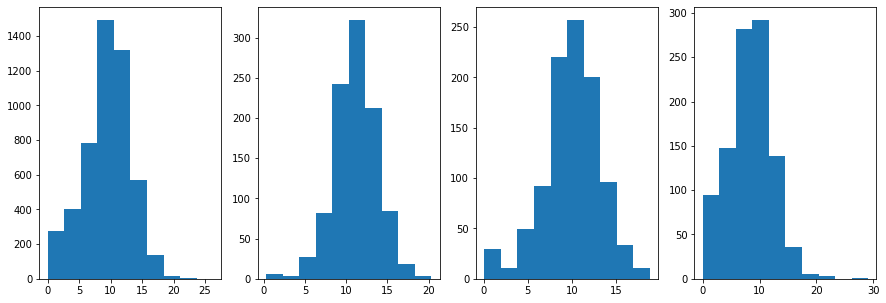

9.475246341596899
11.117109217910357
10.009093955585222
8.364263308183434


In [79]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
axes[0].hist(df_overall["speed_kph"])
axes[1].hist(df_morning["speed_kph"])
axes[2].hist(df_evening["speed_kph"])
axes[3].hist(df_weekend["speed_kph"])
plt.show()

v_overall = np.average(df_overall["speed_kph"])
v_morning = np.average(df_morning["speed_kph"])
v_evening = np.average(df_evening["speed_kph"])
v_weekend = np.average(df_weekend["speed_kph"])

print(v_overall)
print(v_morning)
print(v_evening)
print(v_weekend)

## Shapiro-Wilk Normality Test

In [154]:
from scipy.stats import shapiro

stat_overall, p_overall = shapiro(df_overall["speed_kph"])
stat_morning, p_morning = shapiro(df_morning["speed_kph"])
stat_evening, p_evening = shapiro(df_evening["speed_kph"])
stat_weekend, p_weekend = shapiro(df_weekend["speed_kph"])

print(f"Statistic={stat_overall}, p-value={p_overall}")
print(f"Statistic={stat_morning}, p-value={p_morning}")
print(f"Statistic={stat_evening}, p-value={p_evening}")
print(f"Statistic={stat_weekend}, p-value={p_weekend}")

Statistic=0.9878463745117188, p-value=2.390756988285541e-20
Statistic=0.987712025642395, p-value=1.979585135813977e-07
Statistic=0.980106770992279, p-value=1.8767710996403508e-10
Statistic=0.9871954321861267, p-value=1.1525112597610132e-07


## Unsupervised Machine Learning

Since my original map was essentially a RAG chart, I used 3 clusters to see if we could find cyclists in classes of "high", "medium" or "low". Notably, the fitted predictions seem to say that "Fast" cyclists (red) are clustered close to Pall Mall i.e. city of London. "Medium" cyclists (amber) are clustered in NE london while "Slow" cyclists (green) are clustered around SW London. This could be due to to prevalence of parks like Hyde Park.

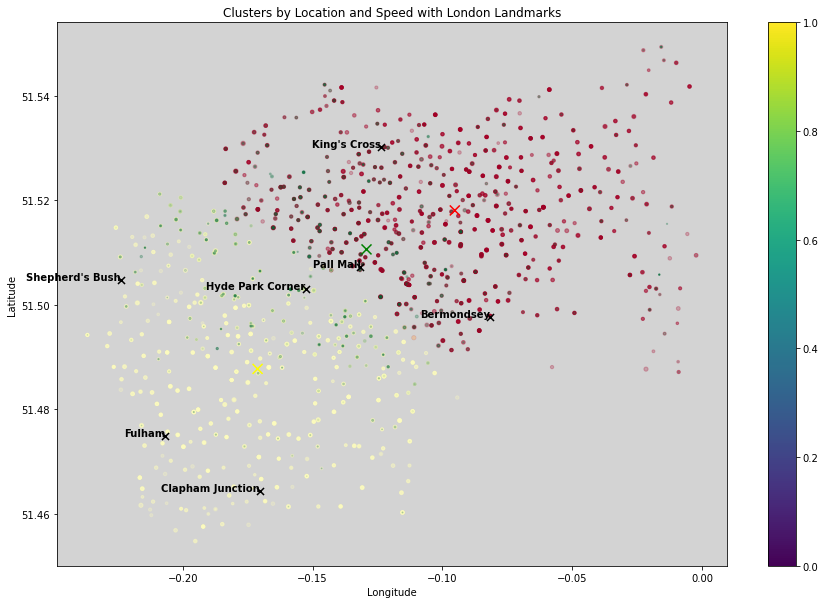

In [179]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

landmarks = {
    'Fulham': [51.4749, -0.2069],
    'Shepherd\'s Bush': [51.5047, -0.2238],
    'Hyde Park Corner': [51.5031, -0.1527],
    'Clapham Junction': [51.4643, -0.1703],
    'Pall Mall': [51.5073, -0.1316],
    'King\'s Cross': [51.5302, -0.1236],
    'Bermondsey': [51.4976, -0.0816]
}

def plotMyModel(df):
    plt.figure(figsize=(15, 10))
    plt.gca().set_facecolor('lightgrey')
    plt.scatter(df_overall['starting_longitude'], df_overall['starting_latitude'],
                c=df_overall['cluster'], cmap='RdYlGn_r', s=df_overall['speed_kph'], alpha=0.25)

    # iterate through the dictionary of landmarks and plot x,y from tuple
    for landmark, (lat, lon) in landmarks.items():
        plt.text(lon, lat, landmark, fontsize=10, ha='right', color='black', weight='bold')
        plt.scatter(lon, lat, color = 'black', s=50, marker='x')

    centroids = scaler.inverse_transform(kmeans.cluster_centers_)  # plot centroids
    plt.scatter(centroids[:, 1], centroids[:, 0], marker='x', s=100, color=['green', 'yellow', 'red'], label='Centroids')

    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.colorbar()
    plt.title('Clusters by Location and Speed with London Landmarks')
    plt.show()

    
# Standard scaler as data is approximately normal
data = df_overall[['starting_latitude', 'starting_longitude', 'speed_kph']]
scaler = StandardScaler() 
scaled_data = scaler.fit_transform(data)
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_data)
    
df_overall["cluster"] = kmeans.labels_
plotMyModel(df_overall)

## K-means Validation

In [130]:
silhouette_avg = silhouette_score(scaled_data, kmeans.labels_)
print("Silhouette Score:", silhouette_avg)
print("Inertia:", kmeans.inertia_)

Silhouette Score: 0.2943852411761844
Inertia: 7667.032494660571


## HDB Scan Comparison

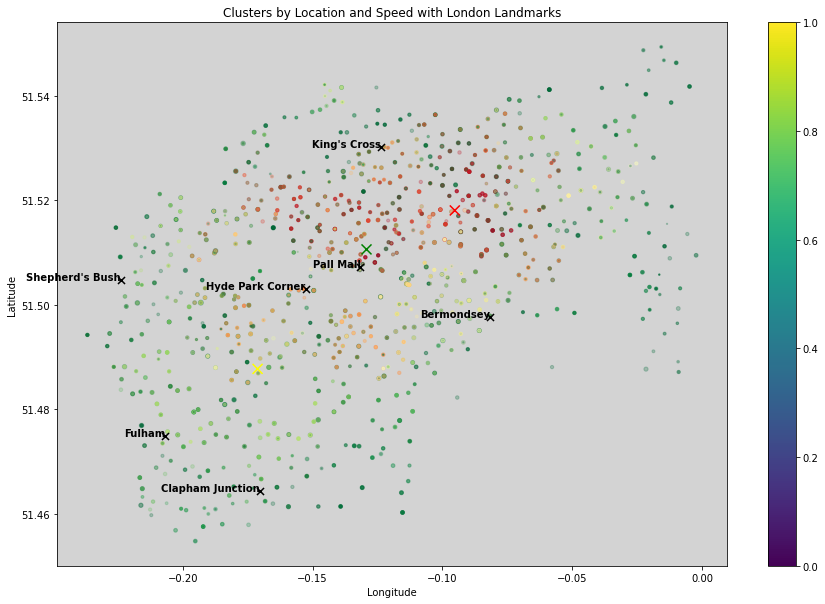

In [168]:
import hdbscan
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=1)

df_overall["cluster"] = hdbscan_model.fit_predict(scaled_data)
plotMyModel(df_overall)

## HDB Validation

In [162]:
silhouette_avg = silhouette_score(scaled_data, df_overall["cluster"])
print("Silhouette Score:", silhouette_avg)

unique_clusters = np.unique(df_overall["cluster"])
inertia = 0
for cluster_id in unique_clusters:
    if cluster_id != -1: #skip noise
        cluster_points = scaled_data[df_overall["cluster"] == cluster_id]
        cluster_center = np.mean(cluster_points, axis=0)
        distances = np.linalg.norm(cluster_points - cluster_center, axis=1)
        inertia += np.sum(distances ** 2)
print("Inertia (Sum of squared distances to cluster centers):", inertia)

Silhouette Score: 0.2943852411761844
Inertia (Sum of squared distances to cluster centers): 7667.025726336152


## Commentary

HDB produces a Silhouette score close to 0 while K-means is about 0.3. Scores range from -1 to 1. So, K-means appears to produce centroids which have less overlap. For geospatial data, this suggests it is more appropriate to draw decision boundaries. Namely, it appears that around City of London, users travel quickly. Near Hyde Park & Kensington, users appear to travel slowly. The remaining users in SW London travel moderately. However, HDB has a significantly lower Inertia score of 123 compared to 7667 which suggests the clusters it found are more compact.

<b>Note:</b> Results subject to vary between offline and online versions as live SQL pulls in different data.

# Station Usage

## New API Call

In my SQL query, I found the Top 10 ranked stations by total number of rides, then I broke down the data by month to show the seasonality of stations. I then generated 2 metrics for analysis. I defined the station popularity for each station relative to the Top 10 stations. And I defined the popularity absolute to all ~500 stations.

In [135]:
sql = read_sql_file('popular_stations_query.sql', current_dir)
df_stations = client.query(sql).to_dataframe()
df_stations.head()

,ride_month,start_station_name,monthly_rides,total_rides_for_month,total_rides_for_month_top10,popularity_relative_top10,popularity_absolute
0,2021-01,"Albert Gate, Hyde Park",1511,405015,16036,9.423,0.373
1,2021-02,"Albert Gate, Hyde Park",2561,504154,23574,10.864,0.508
2,2021-03,"Albert Gate, Hyde Park",4380,738522,38082,11.501,0.593
3,2021-04,"Albert Gate, Hyde Park",5984,930934,47786,12.522,0.643
4,2021-05,"Albert Gate, Hyde Park",4677,912059,39948,11.708,0.513


## Time Series Data

Generally, all stations increase in popularity over summer including work-related locations like Waterloo & Liverpool St. However, Hyde Park corner disproportionaltely rises in popularity during summertime during both years then dips in winter. It indicates that people are more inclined to use the park as a form of leisure when the weather is inviting.

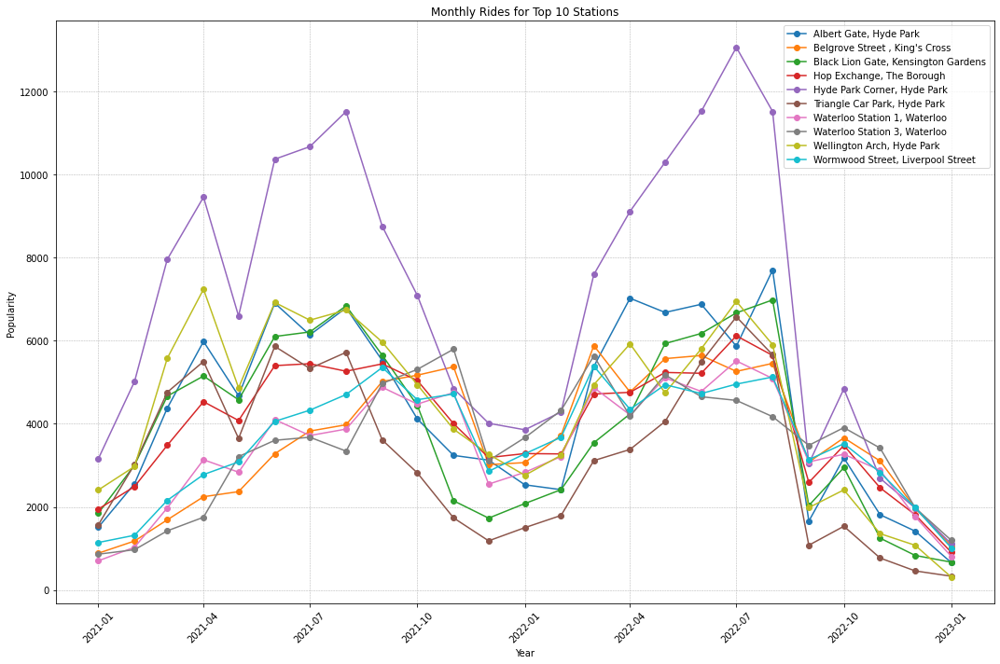

In [177]:
def plotSettings(plt, title):
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Popularity')
    plt.xticks(rotation=45)
    plt.legend(loc='upper right')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.tight_layout()
#     plt.show()
    return plt

df_stations['ride_month'] = pd.to_datetime(df_stations['ride_month'])

plt.figure(figsize=(15,10))
for station in df_stations['start_station_name'].unique():
    subset = df_stations[df_stations['start_station_name'] == station]
    plt.plot(subset['ride_month'], subset['monthly_rides'], label=station, marker='o')

plotSettings(plt, 'Monthly Rides for Top 10 Stations')
plt.show()

## Relative Station Popularity

In [175]:
def plotMonthly(df_stations, field, title):
    monthly_popularity = df_stations.groupby(['start_station_name', 'ride_month'])[field].mean().reset_index()
    plt.figure(figsize=(15,10))
    for station in monthly_popularity['start_station_name'].unique():
        subset = monthly_popularity[monthly_popularity['start_station_name'] == station]
        plt.plot(subset['ride_month'], subset[field], label=station, marker='o')
    plotSettings(plt, title)
    return monthly_popularity

def plotStacks(monthly_popularity, field, title):
    pivot_data = monthly_popularity.pivot(index='ride_month', columns='start_station_name', values=field)
    ax = pivot_data.plot(kind='bar', stacked=True, figsize=(15,10))
    plotSettings(plt, title)
    return pivot_data

## Final Observations

When looking at the popularity for the top 10 stations, they collectively average about 5% of all rides. However, they should theoretically represent about 2% of all rides. So while they don't dominate London and it suggests that the network is quite evenly distributed, it does suggests they are significantly more popular than other stations.

Liverpool St. (teal), Waterlook (grey) & King's Cross (orange) rise in popularity when Hyde Park (purple) falls. This suggests that the usage of cycling gravitates away from leisure and towards commuting further away from summer.

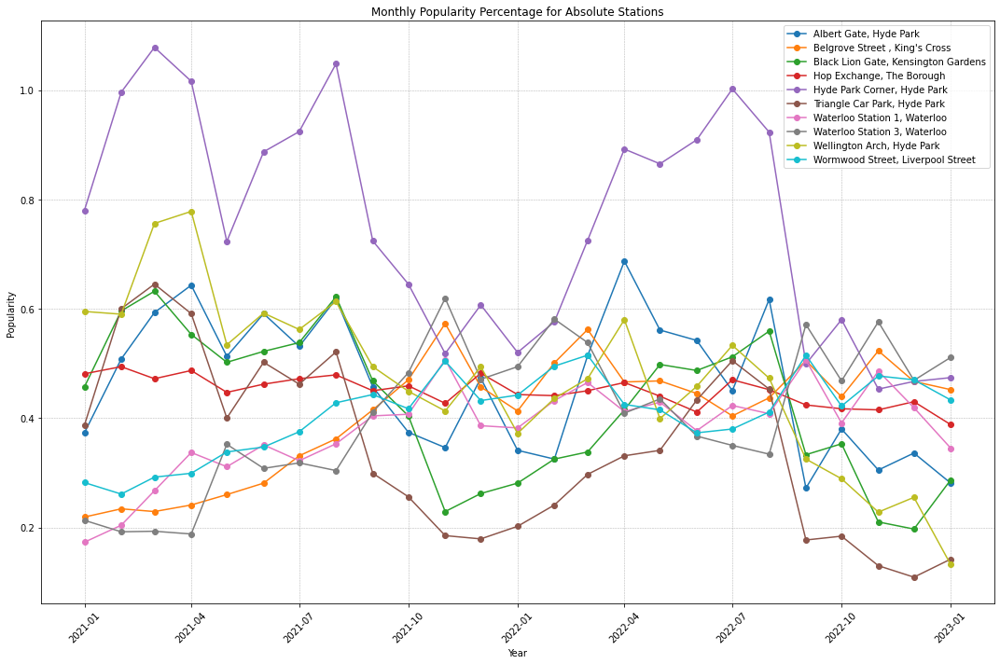

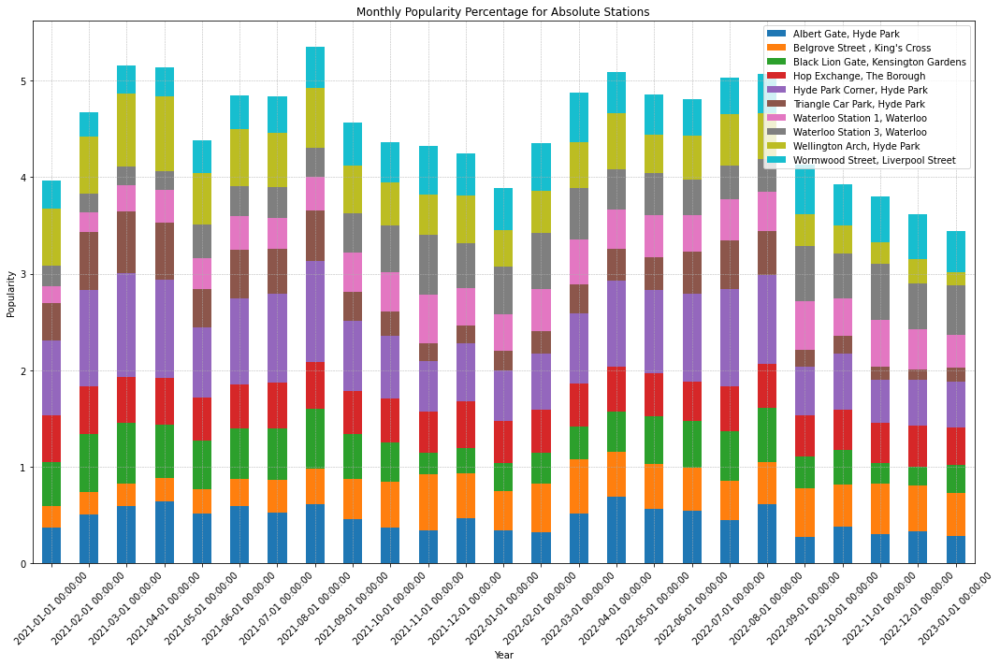

In [176]:
popularity = plotMonthly(df_stations, 'popularity_absolute', 'Monthly Popularity Percentage for Absolute Stations')
pivot_data = plotStacks(popularity, 'popularity_absolute', 'Monthly Popularity Percentage for Absolute Stations')

In [140]:
unique_stations = df['start_station_name'].nunique()
theoretical_proportion = round(10/unique_stations * 100, 1)
print(f"With {unique_stations} stations, Top 10 should represent {theoretical_proportion}% of all bike rides.")

With 510 stations, Top 10 should represent 2.0% of all bike rides.


# Reflections

## Recommendations for Future Work

I would render an animation where you could see the same Folium mapping move through time using the mouse i.e. each frame represents a period and there is some sort of progress-bar to measure time. Going from rush-hour to weekends, you would expect to see a shift from red to green.

Thank you for reading.